In [1]:
import torchvision
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import torch
import numpy as np
from torch import nn
import torch.nn.functional as F
import torch.nn.init as init
from torch.utils.data import random_split, DataLoader
from matplotlib.colors import Normalize
import seaborn as sns




In [2]:
generator=torch.Generator().manual_seed(23)

In [3]:
class linear:
    def __init__(self, fan_in, fan_out,generator, bias=True, name='linear', ):
        self.name=name
        # self.w = torch.randn(fan_in, fan_out)
        # self.w = torch.randn(fan_in, fan_out)/fan_in**0.5 #from normal distribution
        # self.w = torch.rand(fan_in, fan_out, generator=generator)/fan_in**0.5  #from uniform distribution -> pytorch uses uniform i believe
        self.w = ((2*(torch.rand(fan_in, fan_out, generator=generator)) )-1) /fan_in**0.5 #-> sampled between -1 and 1
        self.bias = torch.randn(fan_out,generator=generator) if bias else None
    def __call__(self, x):
        # print(x.shape)
        self.out = x @ self.w
        if self.bias is not None:
            self.out += self.bias
        return self.out
    def parameters(self):
        return [self.w] + ([] if self.bias is None else [self.bias])
class relu:
    def __init__(self, name='relu'):
        self.name=name
        self.out = None
    def __call__(self,x):
        # self.out =torch.where(x>0, x, 0.0)
        self.out= torch.maximum(x, torch.zeros_like(x))
        return self.out
    def parameters(self):
        return []
class tanh:
    def __call__(self,x):
        self.out = torch.tanh(x)
        return self.out
    def parameters(self):
        return []
class flatten:   
    def __call__(self, x):
        self.out = x.view(x.size(0), -1) #keep the batch dimension
        # self.out=torch.flatten(x)
        return self.out
    def parameters(self):
        return []
class softmax:
    def __init__(self, beta=1.0):
        self.beta=beta
    def __call__(self, x):
        max = torch.max(x)
        x=x-max
        self.out = torch.exp(x)/torch.sum(torch.exp(x))
        return self.out
    def parameters(self):
        return []

class conv_2d:
    def __init__(self, n_filters, input_shape,  generator, pad = 0,stride=1, kernel_size=3, kaiming=True):
        self.generator=generator
        self.kernel_size = kernel_size
        self.stride=stride
        self.pad=pad
        self.n_filters = n_filters
        self.image_size = (input_shape[1],input_shape[2])
        self.n_chanels =input_shape[0]
        # self.batch_size= batch_size
        self.out_size = (int((((self.image_size[0] - self.kernel_size + 2 * self.pad )/self.stride )+ 1 )), int((((self.image_size[1] - self.kernel_size + 2 * self.pad )/self.stride )+ 1 )))

        self.kernel = torch.randn(self.n_filters,self.n_chanels,self.kernel_size,self.kernel_size, generator=self.generator)
        # self.bias=torch.randn(size=( self.n_filters, self.out_size[0], self.out_size[1]), generator=self.generator)
        # Initializing the weights using Kaiming He initialization (for ReLU activations)
        if kaiming:
            init.kaiming_normal_(self.kernel, mode='fan_in', nonlinearity='relu')
    
    def __call__(self, x):
        # print('x shape',x.shape)
        if x.dim() < 4:
            x=x.view(-1,self.n_chanels,self.image_size[0],self.image_size[1]) #if there is no batch dimension, add it. Assuming there is a chanels dimension here
        # print('x shape',x.shape)

        unfold = F.unfold(x, kernel_size=(self.kernel_size, self.kernel_size), stride=self.stride, padding=self.pad)
        unfold_t = unfold.transpose(1,2)
        # print('unfold.shape,unfold_t.shape,self.kernel.view(self.n_filters,-1).shape,self.kernel.view(self.n_filters,-1).T.shape')
        # print(unfold.shape,unfold_t.shape,self.kernel.view(self.n_filters,-1).shape,self.kernel.view(self.n_filters,-1).T.shape)
    
        out = unfold_t @ self.kernel.view(self.n_filters,-1).T
        out_t = out.transpose(1,2) #need to transpose cause each column vector correspond to a different filter and when resized they need to be separated. 
        # out_reshaped = out_t.view(self.batch_size,self.n_filters,self.out_size[0],self.out_size[1])
        out_reshaped = out_t.view(-1,self.n_filters,self.out_size[0],self.out_size[1])
        # print('out.shape,\'******\', out_reshaped.shape,\'************\',out, \'******\',out_reshaped')
        # print(out.shape,'******', out_reshaped.shape,'************',out, '******',out_reshaped)
        
        # self.out= out_reshaped + self.bias
        self.out= out_reshaped

        return self.out
    
    def parameters(self):
        # return [self.kernel] + [self.bias]
        return [self.kernel]

class max_pooling:
    def __init__(self, pool_size=2, stride=1):
        self.size=pool_size
        self.stride=stride

    def __call__(self, x):
        batch_size, n_filters, height, width = x.shape
        out_height =int((((height - self.size)/self.stride )+ 1 ))
        out_width=int((((width - self.size)/self.stride )+ 1 ))

        # x is espected to be -> (batch_size, filters_number, height, widht) where filters_number refers to the output from a previous convolution, same as the channels in an picture
        unfold = F.unfold(x, kernel_size=(self.size, self.size), stride=self.stride, padding = 0)
        # split channels dimension ( max pool each channel separately)
        unfold_view=unfold.view(unfold.shape[0],n_filters,int(unfold.shape[1]/n_filters),unfold.shape[2])
        # max in regions dimension
        maxing=unfold_view.max(dim=2)
        reshaped = maxing[0].view(batch_size, n_filters, out_height, out_width)
        self.out = reshaped
        return self.out

    def parameters(self):
        return []


    

# 22/09

In [41]:
kernel_size=3
n_filters=2
n_chanels=3
img_size=(10,10)
out_size = (8,8)  #think how to calculate this dimensions
img = torch.randn(n_chanels,img_size[0], img_size[1])
kernel = torch.randn(n_filters,n_chanels,kernel_size, kernel_size)

In [ ]:
img, img.shape, kernel, kernel.shape

In [115]:
unfold = F.unfold(img.view(1,n_chanels,img_size[0],img_size[1]), kernel_size=(kernel_size, kernel_size), stride=1)
unfold_t = unfold.transpose(1,2)

In [ ]:
unfold, unfold.shape,unfold_t.shape, kernel.view(n_filters,-1),kernel.view(n_filters,-1).shape,kernel.view(n_filters,-1).T.shape

In [117]:
out = unfold_t @ kernel.view(n_filters,-1).T
out_t = out.transpose(1,2) #need to transpose because each column vector correspond to a different filter and when resized they need to be separated. 
out_reshaped = out_t.view(1,n_filters,out_size[0],out_size[1])
out.shape,'******', out_reshaped.shape,'************',out, '******',out_reshaped

(torch.Size([1, 64, 2]),
 '******',
 torch.Size([1, 2, 8, 8]),
 '************',
 tensor([[[  8.5208, -16.4553],
          [ -0.5805,  -6.5963],
          [ -3.2666,  -2.3958],
          [  8.6774,  -3.2280],
          [ -5.7737,  -8.7555],
          [  7.1792,   0.9552],
          [ -4.0857,   5.6453],
          [  2.3286,   0.6218],
          [  4.9390,  -0.5613],
          [  6.2913,   9.9021],
          [  2.4671,   0.2381],
          [ -0.1614,   4.1592],
          [ -0.6860,  -0.6870],
          [ -4.3598,   0.8252],
          [ -3.6177,  -2.0681],
          [  3.5039,   1.7943],
          [ -0.8710,  -0.0202],
          [ -0.4938,   1.4224],
          [ -9.6255,  -6.3673],
          [ -2.0752,   2.3389],
          [ -2.7551,   0.2236],
          [  2.0952,   5.6945],
          [  1.3414,   2.2588],
          [ -9.3165,  -1.0227],
          [ -2.2170,   1.0478],
          [ -8.0105,  -6.0607],
          [  4.0402,   3.6167],
          [ -7.0013,   0.6801],
          [ 14.0028,  -2

## Batched

In [118]:
kernel_size=3
n_filters=2
n_chanels=3
img_size=(10,10)
out_size = (8,8)  #think how to calculate this dimensions
batch_size = 3
img = torch.randn(batch_size,n_chanels,img_size[0], img_size[1])
kernel = torch.randn(n_filters,n_chanels,kernel_size, kernel_size)
img.shape, kernel.shape

(torch.Size([3, 3, 10, 10]), torch.Size([2, 3, 3, 3]))

In [38]:
unfold = F.unfold(img, kernel_size=(kernel_size, kernel_size), stride=1)
unfold_t = unfold.transpose(1,2)
unfold.shape,unfold_t.shape,kernel.view(n_filters,-1).shape,kernel.view(n_filters,-1).T.shape

(torch.Size([3, 27, 64]),
 torch.Size([3, 64, 27]),
 torch.Size([2, 27]),
 torch.Size([27, 2]))

In [39]:
out = unfold_t @ kernel.view(n_filters,-1).T
out_t = out.transpose(1,2) #need to transpose cause each column vector correspond to a different filter and when resized them need to be separated. 
out_reshaped = out_t.view(batch_size,n_filters,out_size[0],out_size[1])
out.shape,'******', out_reshaped.shape,'************',out, '******',out_reshaped

(torch.Size([3, 64, 2]),
 '******',
 torch.Size([3, 2, 8, 8]),
 '************',
 tensor([[[  1.0488,   3.4118],
          [ -3.9279,  -5.3006],
          [  7.6941,   2.6088],
          [ -4.6684,  -1.8660],
          [  3.9467,  -2.5577],
          [ -9.8115,   2.9140],
          [ 14.0812,   2.4157],
          [ -2.9578,   3.7956],
          [  0.6523,   5.9126],
          [  2.9627,  -2.2530],
          [ -0.9482,  10.7030],
          [  9.9015,   8.3142],
          [  1.7399, -12.5170],
          [  1.9575,   0.3479],
          [  4.3999,   4.4379],
          [ -5.3539,  -0.1505],
          [  1.1187,   2.9897],
          [  3.2820,   5.4048],
          [  3.2155,   2.9525],
          [ -6.9345,  -1.9575],
          [ 10.2916,   5.0859],
          [ -5.3530,   2.9058],
          [ -4.3481,   4.1949],
          [  4.8650,  -7.4271],
          [  4.4072,   0.4074],
          [ -3.1052,   7.1460],
          [  0.2868,   0.8687],
          [  7.8779,  -5.8848],
          [-16.3172,  -3

## Layer implemented

In [40]:
generator=torch.Generator().manual_seed(23)
conv = conv_2d(n_filters=25, input_shape=(3,10,10), pad=0,stride=1,kernel_size=3,batch_size=3,generator=generator)

In [41]:
conv.kernel.shape, conv.bias.shape

(torch.Size([25, 3, 3, 3]), torch.Size([3, 25, 8, 8]))

In [42]:
out= conv(img)
out

tensor([[[[  4.9667,  -1.5035,   2.4123,  ...,  -0.1181,   6.2849,   5.7458],
          [  1.8578,   1.6186,  -1.2612,  ...,  -3.1900,   4.4867,   0.3419],
          [ 10.3249,  -8.6900,  -1.5801,  ...,   5.0023,  -5.1307,  -9.1202],
          ...,
          [ -6.3668,   6.0316,   2.7046,  ...,   3.6790,   2.1710,  -2.4656],
          [ 18.1673, -11.7132,   2.7785,  ...,  -1.6867,  -2.6758,   2.3859],
          [  1.1854,   6.4110,  -2.8518,  ...,  -3.5600, -10.0466,   5.7576]],

         [[ 10.6542, -10.3428,   7.0734,  ...,  -3.6958,   6.2849,   7.4155],
          [  4.2251,  -0.1933,  -3.2382,  ...,   2.4680,   5.6858, -11.5989],
          [  3.2242,  -2.7386,  -3.0792,  ...,   3.8114,  -3.7278, -11.1391],
          ...,
          [ -1.2046,   6.2260,   2.9978,  ...,  -2.2803,   7.6502,  -6.0497],
          [  4.4031,   0.8204,  -0.4408,  ...,   4.1728,  -2.9127,  -2.5914],
          [ -5.4571,   3.5173,  -4.5868,  ...,  -6.8401,  -1.5814,   1.5282]],

         [[  4.4255,   0.0624,

In [43]:
tanh_layer=tanh()
relu_layer=relu()
tanh_out=tanh_layer(out)
relu_out=relu_layer(out)
out.shape, tanh_out.shape, relu_out.shape

(torch.Size([3, 25, 8, 8]),
 torch.Size([3, 25, 8, 8]),
 torch.Size([3, 25, 8, 8]))

In [44]:
pool_img=torch.randn(size=(2,3,6,6))
pooling_layer=max_pooling(pool_size=2, stride=2)
pooling_out= pooling_layer(pool_img)
pool_img, pool_img.shape,pooling_out, pooling_out.shape


(tensor([[[[-0.6872, -0.9045,  0.2900,  1.3248, -0.3831,  1.3042],
           [-0.0640, -2.0336,  2.6703,  0.2432,  0.3315,  0.0601],
           [ 2.7348,  0.5419,  0.3247,  0.3671, -0.3546,  1.2013],
           [-0.4830, -0.5576, -0.8521, -0.9655,  0.0853, -1.8734],
           [-1.0060,  0.1236, -0.2360, -0.5334,  1.1565,  0.7474],
           [ 1.0014,  0.3348,  1.5196, -0.0266,  0.4138,  0.2944]],
 
          [[-0.5638,  0.4260, -0.3711, -0.9964,  0.1801,  0.3484],
           [ 0.2596,  0.7283, -0.0037,  1.4594,  0.2457,  0.8974],
           [-0.2076, -0.9054, -0.1193, -0.3964,  0.8846,  1.1472],
           [-1.3294,  1.9607,  1.3031, -0.3782,  1.1202,  1.1782],
           [-0.1231, -0.1721,  0.7683,  0.6765,  0.2645,  0.2866],
           [-1.2058,  1.4311, -1.4635, -1.3455, -2.3217, -0.5978]],
 
          [[ 1.4735,  0.5318,  0.6649,  0.1391, -0.5555, -0.2190],
           [ 0.1029,  2.2683,  0.2377, -1.1382, -0.8381,  0.3847],
           [ 0.5644, -1.1281,  0.4313, -1.5833,  1.4260,

# Dataset
fasion mnist

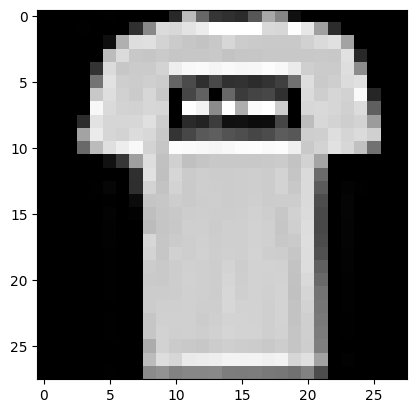

In [4]:
root = './FMNIST/'
# dataset = torchvision.datasets.FashionMNIST(root = root, train = True, transform = transforms.ToTensor(), download=True)
dataset = torchvision.datasets.FashionMNIST(root = root, train = True, transform = transforms.ToTensor())
x= dataset.__getitem__(1)
plt.imshow(x[0].squeeze(),cmap='gray');

In [5]:
train_size=0.9*len(dataset)
val_size=0.1*len(dataset)
batch_size = 5
train_dataset, val_dataset = random_split(dataset, [int(train_size),int(val_size) ])
subset_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
validation_loader=DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
validation_iter = iter(validation_loader)

In [6]:
for  sample in subset_loader:
    print(sample[0].shape)
    break

torch.Size([5, 1, 28, 28])


# Neural Network

In [7]:
#conv 2d
batch_size=5
input_shape=(1,28,28)
kernel_size=3
padding=0
n_filters = 5
stride=1
out_shape_conv= int((((input_shape[1] - kernel_size )/stride )+ 1 ))
# maxpooling
pool_size=2
pool_stride=2
out_shape_maxpool=int((((out_shape_conv - pool_size )/pool_stride )+ 1 ))
# linear
input_size=845
# input_size=784
inner_size=128
output_size=64
cat_size=10

generator=torch.Generator().manual_seed(23)
layers = [
    conv_2d(n_filters=n_filters,input_shape=input_shape,generator=generator,pad=padding,stride=stride,kernel_size=kernel_size, kaiming=True),
    relu(),
    max_pooling(pool_size=pool_size, stride=pool_stride),
    # conv_2d(n_filters=n_filters*2,input_shape=(32,out_shape_maxpool,out_shape_maxpool),generator=generator,pad=padding,stride=stride,kernel_size=kernel_size),
    # relu(),
    # max_pooling(pool_size=pool_size, stride=pool_stride),
    flatten(),
    linear(fan_in= input_size,fan_out=inner_size,generator=generator),
    relu(),
    linear(fan_in=inner_size,fan_out=cat_size,generator=generator)
]
parameters = [p for layer in layers for p in layer.parameters()]
for p in parameters:
    p.requires_grad=True

In [8]:
for p in layers[0].parameters():
    print(p.shape)

torch.Size([5, 1, 3, 3])


In [9]:
len(parameters)

5

In [10]:
def forward(x, step=999):
    if step == 0: #in the first step lets print the output shape for each layer
        print(x.shape)
    for layer in layers:
        x=layer(x)
        if step == 0:
            print(layer.__class__)
            print(x.shape)
    return x

In [11]:
len(subset_loader)

10800

In [12]:
lr = 0.1
i=0 #count steps
loss_steps = 500 #steps for logging loss info
len_val=len(val_dataset)
loss_val_batches = 5
max_steps = 10800

post_conv_steps=1000 #lets take the output of the convolution at some steps and plot them
conv_layer=0 #index for the convolution layer to take the outputs
post_conv_img=[]
post_conv_kernel=[]

#aux for storing activations and gradients
out_shapes=[
    (1, 676),     #(1, 32, 26, 26) conv2d -> only first filter
    (1, 676),     #(1, 32, 26, 26) relu -> only first filter
    (1, 169),     #(1, 32, 13, 13) max pooling -> only first filter
    (1, 845),       #flatten
    (1, 128),        #linear
    (1, 128),        #relu
    (1, 10),          #linear
    (1,45)           #kernels
]
out_t =[]
grad_t =[]

for layer in range(len(layers)):
    grad_t_aux=torch.zeros(out_shapes[layer][1],max_steps)
    out_t_aux=torch.zeros(out_shapes[layer][1],max_steps)
    out_t.append(out_t_aux)
    grad_t.append(grad_t_aux)

# separate identical loop so we can add the kernel at last
for layer in range(len(layers)):
    if isinstance(layers[layer], conv_2d):
        kernel_shape=layers[layer].kernel.view(1,-1).shape
        ker_t=torch.zeros(kernel_shape[1],max_steps)
        grad_ker_t=torch.zeros(kernel_shape[1],max_steps)
        out_t.append(ker_t)
        grad_t.append(grad_ker_t)

for batch_x, batch_y in subset_loader:
    
    #feed fowrward
    out = forward(batch_x,i)

    # print(type(out))
    # print(out.shape)
    # print(type(batch_y))
    # print(batch_y.shape)

    #calculate loss
    loss = F.cross_entropy(out, batch_y)
    # print(type(loss))
    # print(loss.shape)

    for layer in layers:
        layer.out.retain_grad() 

    #erase old gradient
    for p in parameters:
        p.grad=None

    #calculate new grads
    loss.backward()

    #store data
    for l in range(len(layers)):        
        out_aux=layers[l].out
        grad_aux=layers[l].out.grad
        # print('layer : ', layers[l].__class__)
        # print('out_shape : ', out_aux.shape)
        # print('grad_shape : ', grad_aux.shape)

        if isinstance(layers[l], conv_2d) or isinstance(layers[l], relu) or isinstance(layers[l], max_pooling):
            if out_aux.dim() > 3:    
                batch_size=out_aux.shape[0]
                out_aux=out_aux[:,1,:,:].reshape(batch_size,-1).detach()    #only first filter -> all outputs for the convolution as a column vector, row after row from top to bottom
                grad_aux=grad_aux[:,1,:,:].reshape(batch_size,-1).detach()  #only first filter
                # print('out_shape reshaped: ', out_aux.shape)
                # print('grad_shape reshaped: ', grad_aux.shape)
        # store out and grad for the layer
        # print(out_aux.mean(dim=0).shape)
        out_t[l][:,i]=out_aux.mean(dim=0).detach() #mean across the batch dimension -> this will also transpose the row vector into a column vector to store it in out_t[l][:,i]
        grad_t[l][:,i] = grad_aux.mean(dim=0).detach() #mean across the batch dimension

        # to visualize the grad in the kernel 
        if isinstance(layers[l], conv_2d):
            # print(grad_t[-1].shape)
            # print(layers[l].kernel.grad.view(-1,1).squeeze(1).shape)
            grad_t[-1][:,i]=layers[l].kernel.grad.view(-1,1).squeeze(1).detach()
            out_t[-1][:,i]=layers[l].kernel.view(-1,1).squeeze(1).detach()
            

    if i % post_conv_steps == 0:
        with torch.no_grad():
            original=batch_x[0,0,:,:].detach().clone()
            img=layers[conv_layer].out.detach().clone() # first dimension would be the batch dimension, lets take only one image and all the filters
            img=img[0,:,:,:]
            post_conv_img.append(original)
            post_conv_img.append(img)

            # print(f'step = {i}, layer = {layers[conv_layer].__class__}, \n kernel : {layers[conv_layer].kernel[1,:,:].detach()}')
            kernel_aux=layers[conv_layer].kernel.detach().clone()
            post_conv_kernel.append(kernel_aux)



    #update parameters
    for p in parameters:
        p.data += -lr*p.grad

    if i % loss_steps == 0:
        with torch.no_grad():
            losses=torch.zeros(loss_steps)
            for j in range(loss_val_batches):
                val_batch=next(validation_iter)
                val_samples=val_batch[0]
                val_truth=val_batch[1]
                # print(sample.shape)
                out_loss = out=forward(val_samples)
                losses[j] = F.cross_entropy(out_loss,val_truth)
            print(f'step = {i}, val loss over {loss_val_batches} batches = {losses.mean()}')
    i+=1
    # break
    if i >= max_steps:
        break

torch.Size([5, 1, 28, 28])
<class '__main__.conv_2d'>
torch.Size([5, 5, 26, 26])
<class '__main__.relu'>
torch.Size([5, 5, 26, 26])
<class '__main__.max_pooling'>
torch.Size([5, 5, 13, 13])
<class '__main__.flatten'>
torch.Size([5, 845])
<class '__main__.linear'>
torch.Size([5, 128])
<class '__main__.relu'>
torch.Size([5, 128])
<class '__main__.linear'>
torch.Size([5, 10])
step = 0, val loss over 5 batches = 0.0254456028342247
step = 500, val loss over 5 batches = 0.00606921873986721
step = 1000, val loss over 5 batches = 0.007787487935274839
step = 1500, val loss over 5 batches = 0.00703005213290453
step = 2000, val loss over 5 batches = 0.002214933978393674
step = 2500, val loss over 5 batches = 0.000871785101480782
step = 3000, val loss over 5 batches = 0.005491154734045267
step = 3500, val loss over 5 batches = 0.0033652069978415966
step = 4000, val loss over 5 batches = 0.006368772592395544
step = 4500, val loss over 5 batches = 0.0040708850137889385
step = 5000, val loss over 5 b

In [13]:
len(grad_t), len(out_t), len(post_conv_kernel)
post_conv_kernel[10],post_conv_kernel[1]

(tensor([[[[ 0.0365, -0.1167, -1.3977],
           [-0.1673,  0.7028, -0.0779],
           [ 0.1588,  0.8354, -0.5734]]],
 
 
         [[[-1.5592, -0.5738,  0.6650],
           [-1.3218,  0.6875,  0.3887],
           [ 0.4252,  0.1477, -0.0116]]],
 
 
         [[[ 0.6115,  0.5154, -1.3175],
           [-0.6506, -0.6693,  1.3844],
           [-0.1080,  0.1847, -0.6047]]],
 
 
         [[[ 0.5529, -1.8787,  1.7136],
           [-0.1599, -1.2407, -0.1742],
           [ 0.1538, -1.0393, -0.8839]]],
 
 
         [[[-1.2224, -0.3529,  1.4642],
           [ 1.0804, -0.1343, -0.1559],
           [-0.0601, -0.1350, -2.7605]]]]),
 tensor([[[[ 0.1451, -0.1384, -1.0899],
           [-0.1064,  0.2897,  0.6762],
           [ 0.3364,  1.1380, -0.8569]]],
 
 
         [[[-1.2900,  0.2177,  0.7775],
           [-1.1515,  0.7238,  0.3306],
           [-0.3799,  0.6560, -0.1586]]],
 
 
         [[[ 0.1427,  0.1204, -0.3255],
           [-0.3568, -0.2453,  0.6028],
           [-0.0695,  0.0950, -0.4537]]]

# some Plots

In [14]:
cos_sim = torch.zeros((len(out_t))*2,max_steps)
cos_sim_grad = torch.zeros((len(out_t))*2,max_steps)

with torch.no_grad():
    for l in range(len(out_t)):
        print(l)
        for i in range(out_t[l].size(1)-1):
            cos_sim_aux = F.cosine_similarity(out_t[l][:,i],out_t[l][:,i+1], dim=-1, eps=1e-6)
            cos_sim_aux_2 = F.cosine_similarity(out_t[l][:,0],out_t[l][:,i+1], dim=-1, eps=1e-6)
            cos_sim[l,i]=cos_sim_aux
            cos_sim[l+len(out_t),i]=cos_sim_aux_2
            #grads
            cos_sim_aux_grad = F.cosine_similarity(grad_t[l][:,i],grad_t[l][:,i+1], dim=-1, eps=1e-6)
            cos_sim_aux_2_grad = F.cosine_similarity(grad_t[l][:,0],grad_t[l][:,i+1], dim=-1, eps=1e-6)
            cos_sim_grad[l,i]=cos_sim_aux_grad
            cos_sim_grad[l+len(out_t),i]=cos_sim_aux_2_grad

print(cos_sim.shape,cos_sim_grad.shape)
    

0
1
2
3
4
5
6
7
torch.Size([16, 10800]) torch.Size([16, 10800])


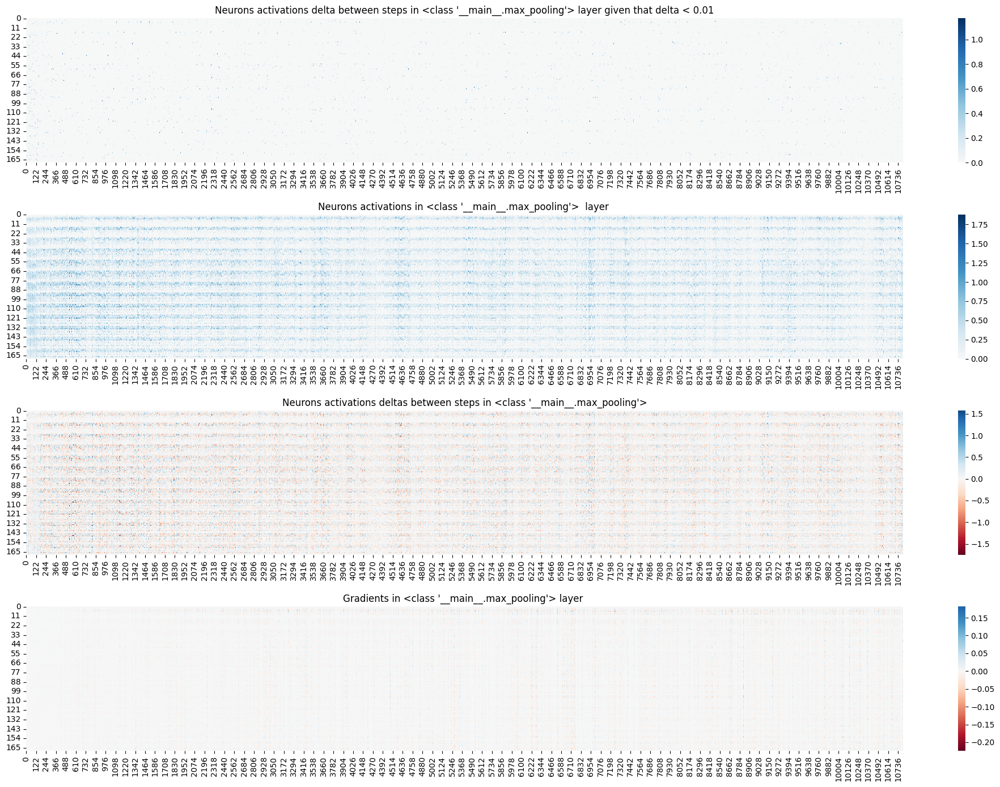

In [15]:
#Kaiming initialization
LAYER= 2
threshold=0.01

out_shape=out_shapes[LAYER][1]

array_mask = torch.abs(out_t[LAYER][:,1:] - out_t[LAYER][:,:-1])< threshold
array_mask=torch.cat((array_mask, torch.full((out_shape,1), True)), dim=1)
array = out_t[LAYER].detach()*array_mask.detach()

array2 = out_t[LAYER].detach().numpy()
array3 =out_t[LAYER][:,1:].detach()- out_t[LAYER][:,:-1].detach() #delta between activations for evvery step

# grads 
array4 =grad_t[LAYER].detach().numpy()

# Step 3: Since plotting all 40k columns can be very dense, let's select a subset (optional)
# You can adjust the number of columns to plot
# subset_array = array[:, 30000:31000]  
subset_array = array[:, :]  # every nth column ::n
subset_array2 = array2[:, :]  # every nth column ::n
subset_array3 = array3[:, :]  # every nth column ::n
subset_array4 = array4[:, :]  # every nth column ::n


# Create a figure
fig, ax = plt.subplots(4, 1, figsize=(20, 14))

# Heatmap with Seaborn
sns.heatmap(subset_array, ax=ax[0], cmap='RdBu', center=0)
title = f'Neurons activations delta between steps in {layers[LAYER].__class__} layer given that delta < {threshold}' if LAYER < 7 else 'kernel delta between steps'
ax[0].set_title(title)

sns.heatmap(subset_array2, ax=ax[1], cmap='RdBu', center=0)
title = f'Neurons activations in {layers[LAYER].__class__}  layer ' if LAYER < 7 else 'kernel'
ax[1].set_title(title)

sns.heatmap(subset_array3, ax=ax[2], cmap='RdBu', center=0)
title = f'Neurons activations deltas between steps in {layers[LAYER].__class__}' if LAYER < 7 else 'kernel deltas'
ax[2].set_title(title)

sns.heatmap(subset_array4, ax=ax[3], cmap='RdBu', center=0)
title = f'Gradients in {layers[LAYER].__class__} layer ' if LAYER < 7 else 'kernel gradients'
ax[3].set_title(title)

# Adjust layout to avoid overlap
plt.tight_layout()
plt.show()


In [16]:
#************************************* COSINE SIMILARITIES ************************************************
#activations
# Create a figure
fig5 = go.Figure()
for s in range(cos_sim.size(0)):
    if s in [2,3,10,11]:
        continue
    # name= f'layer:{s}, {layers[s].__class__}' if s<7 else f'{s-8}-vs-first' 
    if s<7:
        name=f'layer:{s}, {layers[s].__class__}'
    if s>6:
        name=f'{s-8}-vs-first'
    if s==7:
        name=f'conv2 kernels'
    if s==15:
        name=f'conv2 kernels vs first step'
    fig5.add_trace(go.Scatter(
        y=(cos_sim[s]).numpy(),  # Convert each row (tensor) to numpy for plotting
        mode='lines',
        name=name,  # Label each series differently
        line=dict(width=1)  # You can customize color/width here
    ))
# Customize the layout
fig5.update_layout(
    title="Cosine variations between stpes in the activations for each layer",
    xaxis_title="Column Index",
    yaxis_title="Cosine Similarity Activations",
    showlegend=True,
    template="plotly",
    height=500,
    width=1600
)
fig5.show()

#gradients
# Create a figure
fig6 = go.Figure()

for s in range(cos_sim_grad.size(0)):
    if s in [2,3,10,11]:
        continue
    if s<7:
        name=f'layer:{s}, {layers[s].__class__}'
    if s>6:
        name=f'{s-8}-vs-first'
    if s==7:
        name=f'conv2 kernels'
    if s==15:
        name=f'conv2 kernels vs first step'

    fig6.add_trace(go.Scatter(
        y=(cos_sim_grad[s]).numpy(),  # Convert each row (tensor) to numpy for plotting
        mode='lines',
        name=name,  # Label each series differently
        line=dict(width=1)  # You can customize color/width here
    ))
# Customize the layout
fig6.update_layout(
    title="Cosine variations between stpes in the gradients for each layer",
    xaxis_title="Column Index",
    yaxis_title="Cosine Similarity gradients",
    showlegend=True,
    template="plotly",
    height=500,
    width=1600
)
fig6.show()


### histograms

In [17]:
type(out_t[2]),out_t[2].shape,type(out_t)

(torch.Tensor, torch.Size([169, 10800]), list)

In [18]:

bins=80
steps_data=500
steps= np.arange(0, len(out_t[0][1]), steps_data) 
n_layers=len(out_t)-1 #added the kernel in out_t and grad_t 

grads_x = torch.zeros(n_layers, len(steps), bins)
grads_y = torch.zeros(n_layers, len(steps), bins)
act_x = torch.zeros(n_layers, len(steps), bins)
act_y = torch.zeros(n_layers, len(steps), bins)

for step in range(len(steps)):
    for n_layer in range(n_layers):
        activations = out_t[n_layer][:,step]
        gradients = grad_t[n_layer][:,step]
        # print(steps[step],n_layer,activations.shape)

        hy_act, hx_act = torch.histogram(activations,bins, density=True)
        hy_grad, hx_grad = torch.histogram(gradients,bins, density=True)

        grads_x[n_layer,step,:]=hx_grad[:-1]
        grads_y[n_layer,step,:]=hy_grad
        act_x[n_layer,step,:]=hx_act[:-1]
        act_y[n_layer,step,:]=hy_act
grads_x.shape,grads_y.shape, act_x.shape, act_y.shape 

(torch.Size([7, 22, 80]),
 torch.Size([7, 22, 80]),
 torch.Size([7, 22, 80]),
 torch.Size([7, 22, 80]))

In [19]:
#Activations
n_to_plot = n_layers-2 #remove flatten and maxpooling
fig = make_subplots(rows=n_to_plot, cols=1, subplot_titles=[f'Layer {i}, {layers[i].__class__}' for i in [0,1,4,5,6]])
k=1

fig.print_grid()
for i in range(n_layers):
    s=0
    if isinstance(layers[i], max_pooling) or isinstance(layers[i], flatten):
        continue
    histo_x= act_x[i,:,:]  
    histo_y= act_y[i,:,:]   
    for hx, hy in zip(histo_x,histo_y):
        spin = s*steps_data
        fig.add_trace(go.Scatter(x=hx, y=hy, mode='lines', name=spin), row=k, col=1)
        s+=1
    k+=1
fig.update_layout(height=1300, width=1300, title_text="Layers activations vs training step")

# fig.show()

This is the format of your plot grid:
[ (1,1) x,y   ]
[ (2,1) x2,y2 ]
[ (3,1) x3,y3 ]
[ (4,1) x4,y4 ]
[ (5,1) x5,y5 ]



In [20]:
#Gradients
n_to_plot = n_layers-2 #remove flatten and maxpooling
fig = make_subplots(rows=n_to_plot, cols=1, subplot_titles=[f'Layer {i}, {layers[i].__class__}' for i in [0,1,4,5,6]])
k=1

fig.print_grid()
for i in range(n_layers):
    s=0
    if isinstance(layers[i], max_pooling) or isinstance(layers[i], flatten):
        continue
    histo_x= grads_x[i,:,:]  
    histo_y= grads_y[i,:,:]   
    for hx, hy in zip(histo_x,histo_y):
        spin = s*steps_data
        fig.add_trace(go.Scatter(x=hx, y=hy, mode='lines', name=spin), row=k, col=1)
        s+=1
    k+=1
fig.update_layout(height=1300, width=1300, title_text="Layers gradients vs training step")

This is the format of your plot grid:
[ (1,1) x,y   ]
[ (2,1) x2,y2 ]
[ (3,1) x3,y3 ]
[ (4,1) x4,y4 ]
[ (5,1) x5,y5 ]



In [21]:
n_to_plot

5

# Plot some convolution steps

### Images

In [22]:

type(post_conv_img), len(post_conv_img), type(post_conv_img[0]), post_conv_img[0].shape,post_conv_img[1].shape

(list, 22, torch.Tensor, torch.Size([28, 28]), torch.Size([5, 26, 26]))

In [23]:
images = []
filters, height, widht = post_conv_img[1].shape
for image in range(len(post_conv_img)):
    if post_conv_img[image].dim()>2:
        for filter in range(filters):
            img=post_conv_img[image][filter,:,:]
            images.append(img.numpy())
    else:
        images.append(post_conv_img[image].numpy())

type(images), len(images), type(images[0]), images[0].shape,images[1].shape,images[6].shape

(list, 66, numpy.ndarray, (28, 28), (26, 26), (28, 28))

<function matplotlib.pyplot.show(close=None, block=None)>

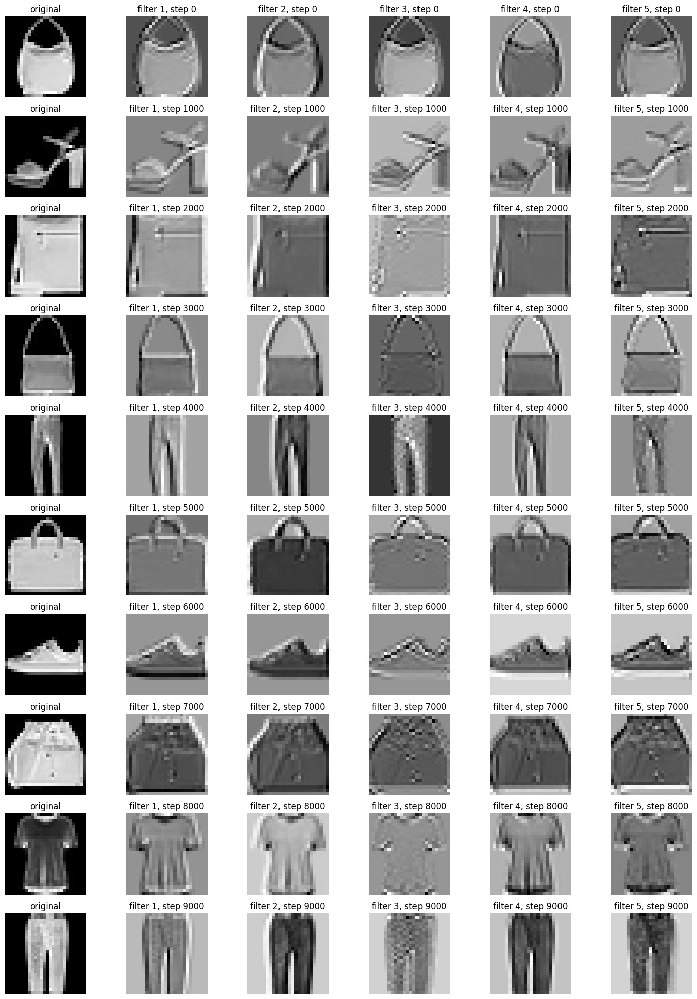

In [28]:
# Set up the figure and axes grid (5 rows, 4 columns)
fig, axes = plt.subplots(nrows=10, ncols=6, figsize=(15, 20))

for row in range(10):
    for column in range(6):

        img_idx = column + 6*row   #img index in the list
        name= 'original' if images[img_idx].shape[0]==28 else f'filter {column}, step {row*post_conv_steps}'
        axes[row, column].imshow(images[img_idx],cmap='gray')
        axes[row, column].axis('off')
        axes[row, column].set_title(f'{name}')
plt.tight_layout()
plt.show

### Kernels

In [48]:
type(post_conv_kernel), len(post_conv_kernel), type(post_conv_kernel[0]), post_conv_kernel[0].shape

(list, 11, torch.Tensor, torch.Size([5, 1, 3, 3]))

In [29]:
kernels= []
n_kernles, n_channels, height, widht = post_conv_kernel[1].shape
for step in range(len(post_conv_kernel)):
        for filter in range(n_kernles):
            knl=post_conv_kernel[step][filter,0,:,:]
        
            kernels.append(knl.numpy())

type(kernels), len(kernels), type(kernels[0]), kernels[0].shape

(list, 55, numpy.ndarray, (3, 3))

<function matplotlib.pyplot.show(close=None, block=None)>

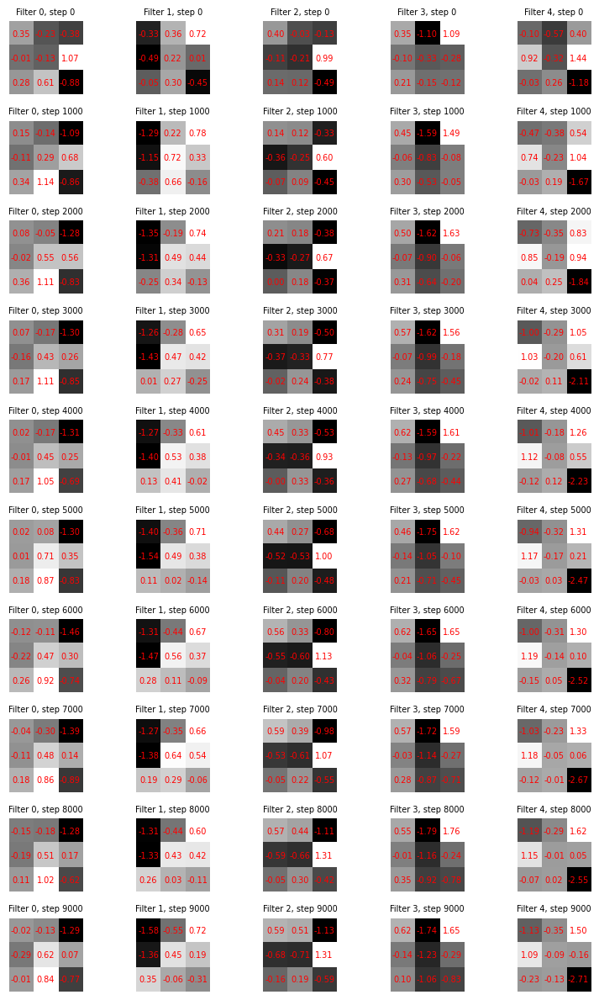

In [34]:
# Set up the figure and axes grid (5 rows, 4 columns)
fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(8, 12))

for row in range(10):
    for column in range(5):
        knl_idx = column + 5*row   #kernel index in the list
        name= f'Filter {column}, step {row*post_conv_steps}'
        axes[row, column].imshow(kernels[knl_idx],cmap='gray')
        axes[row, column].axis('off')
        axes[row, column].set_title(f'{name}', fontsize=7)
        
        # Annotate each pixel with its corresponding value
        for i in range(3):  # Loop over kernel rows
            for j in range(3):  # Loop over kernel columns
                # Get the value of the kernel at position (i, j)
                value = kernels[knl_idx][i, j].item()  # Convert to scalar if it's a tensor
                
                # Annotate the value at position (i, j)
                axes[row, column].text(j, i, f'{value:.2f}',  # Format to 2 decimal places
                                       ha='center', va='center', color='red', fontsize=7)
plt.tight_layout()
plt.show

# Predictions

torch.Size([1, 28, 28])
ground truth: 9
prediction:  9
tensor([[-4.4178, -2.5865, -3.3334, -4.5889, -4.7039,  1.0110, -3.6691,  7.9214,
         -1.7005, 11.7693]])


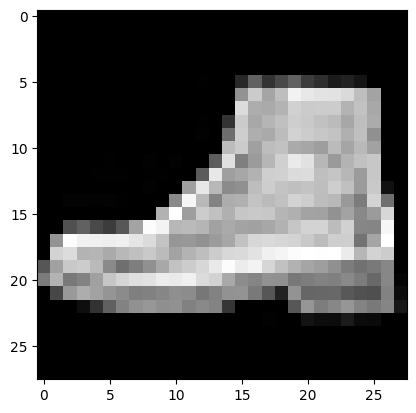

In [35]:
index = torch.randint(low=0,high=len(val_dataset), size=(1,1))
sample_row = val_dataset.__getitem__(index)
sample=sample_row[0]
gt=sample_row[1]
plt.imshow(sample.squeeze(),cmap='gray');
print(sample.shape)
print('ground truth:', gt)

with torch.no_grad():
    out = forward(sample.view(1,1,28,28))
print('prediction: ',np.argmax(out).item())
print(out)


